In [1]:
!pip install natsort

In [46]:
'''
PSNR/SSIM Goalposts
Gaussian Blur: 20.5/0.65
Motion Blur: 21.5/0.70
Salt and Pepper noise: 26.5/0.90
Gaussian noise: 19.5/0.60
Speckle noise: 20.0/0.65
'''

from tqdm.notebook import tqdm
from PIL import Image, ImageOps
import numpy as np
import matplotlib.pyplot as plt
from natsort import natsorted
from glob import glob
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
from skimage import filters

import cv2 
import os

### Noise Imgs

In [3]:
# read files from artifial noises and original images
sp_files = natsorted(glob("sp_noise/*"))
gaussian_files = natsorted(glob("gaussian_noise/*"))
speckle_files = natsorted(glob("speckle_noise/*"))

clean_files = natsorted(glob("input_imgs/*"))

print(len(sp_files))
print(len(gaussian_files))
print(len(speckle_files))
print(len(clean_files))

11
11
11
11


#### sp Imgs

0it [00:00, ?it/s]

C:\Users\yyxyy\AppData\Local\Temp\ipykernel_14392\31925015.py:25: FutureWarning: `selem` is a deprecated argument name for `median`. It will be removed in version 1.0. Please use `footprint` instead.
  filtered_red = filters.median(red_channel, selem = np.ones((kernel_size, kernel_size)))
C:\Users\yyxyy\AppData\Local\Temp\ipykernel_14392\31925015.py:26: FutureWarning: `selem` is a deprecated argument name for `median`. It will be removed in version 1.0. Please use `footprint` instead.
  filtered_green = filters.median(green_channel, selem = np.ones((kernel_size, kernel_size)))
C:\Users\yyxyy\AppData\Local\Temp\ipykernel_14392\31925015.py:27: FutureWarning: `selem` is a deprecated argument name for `median`. It will be removed in version 1.0. Please use `footprint` instead.
  filtered_blue = filters.median(blue_channel, selem = np.ones((kernel_size, kernel_size)))
C:\Users\yyxyy\AppData\Local\Temp\ipykernel_14392\31925015.py:32: FutureWarning: `multichannel` is a deprecated argument nam

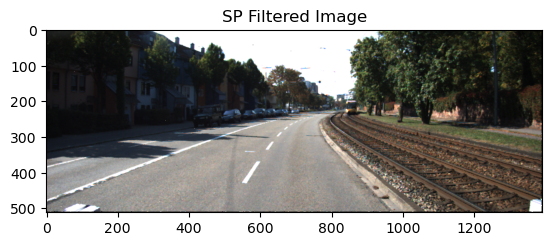

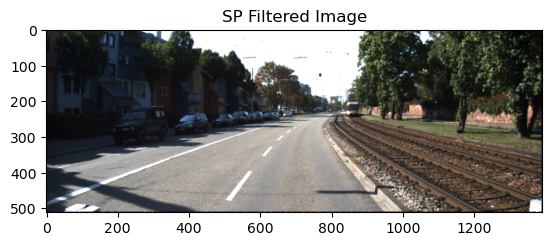

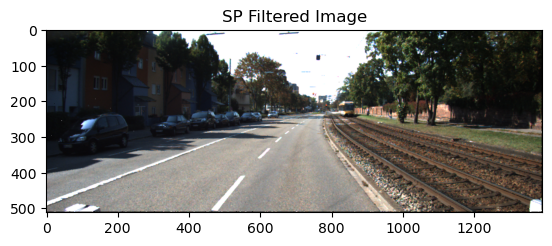

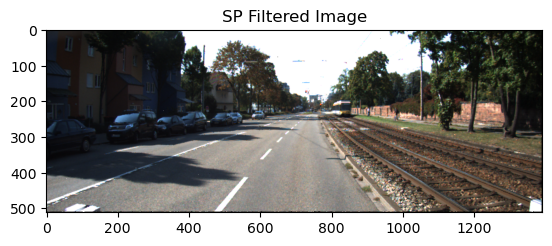

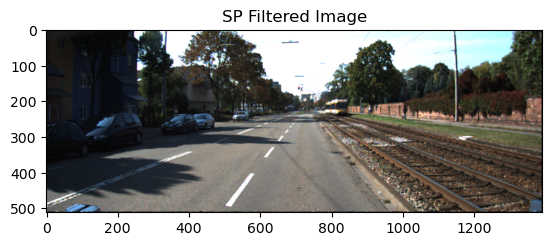

...

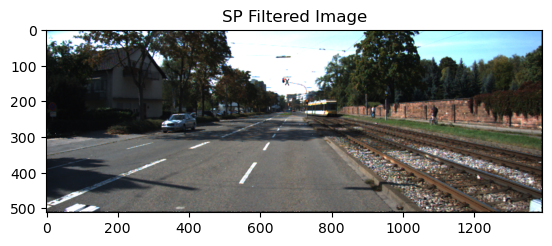

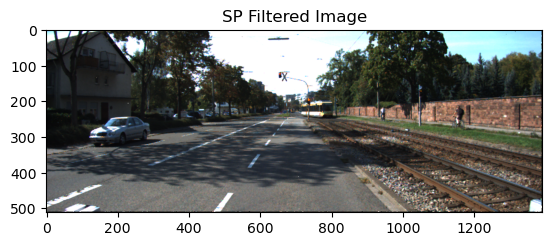

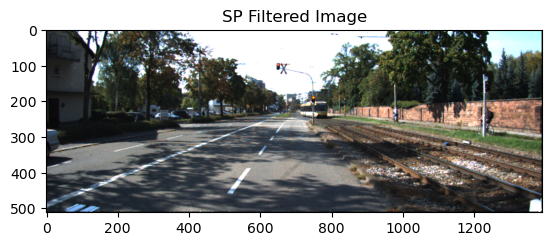

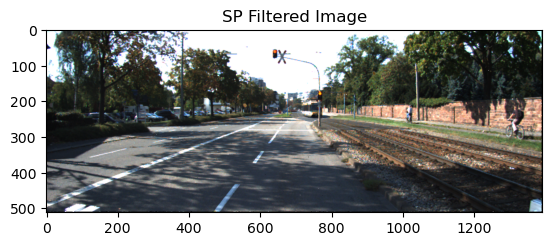

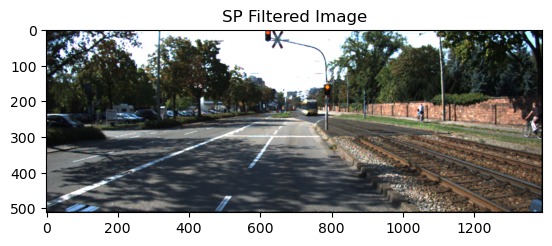

26.765740881545092
0.9232724604869713


In [5]:
import os
# median filter
kernel_size = 3

psnr_sum = 0
ssim_sum = 0
counter = 1

save_dir = 'output_imgs/sp_output_imgs'

# Check if the save directory exists, create it if not
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

for sp_file, clean_file in tqdm(zip(sp_files, clean_files)):
    img = np.array(Image.open(clean_file))/255.0
#     img = np.array(ImageOps.grayscale(Image.open(clean_file)))/255.0
    sp_img = np.array(Image.open(sp_file))/255.0
#     noisy_img = np.array(ImageOps.grayscale(Image.open(noisy_file)))/255.0
    
    red_channel = sp_img[:, :, 0]
    green_channel = sp_img[:, :, 1]
    blue_channel = sp_img[:, :, 2]
    
    filtered_red = filters.median(red_channel, selem = np.ones((kernel_size, kernel_size)))
    filtered_green = filters.median(green_channel, selem = np.ones((kernel_size, kernel_size)))
    filtered_blue = filters.median(blue_channel, selem = np.ones((kernel_size, kernel_size)))

    filtered_img = np.stack([filtered_red, filtered_green, filtered_blue], axis=-1)
    
    psnr_sum += psnr(filtered_img, img)
    ssim_sum += ssim(filtered_img, img, multichannel=True)
    
    
    # plt.imshow(img, cmap = 'gray')
    # plt.title("The Ground True Image")
    # plt.savefig(os.path.join(save_dir, f"ground_true_image_{counter}.png")) 
    # plt.show()

    # plt.imshow(sp_img, cmap = 'gray')
    # plt.title("Salt and Pepper noise Image")
    # plt.savefig(os.path.join(save_dir, f"salt_and_pepper_image_{counter}.png"))
    # plt.show()

    plt.imshow(filtered_img, cmap = 'gray')
    plt.title("SP Filtered Image")
    plt.savefig(os.path.join(save_dir, f"sp_filtered_image_{counter}.png"))
    plt.show()

    counter += 1 

print(psnr_sum/11)
print(ssim_sum/11)


#### Gaussian Imgs

0it [00:00, ?it/s]

C:\Users\yyxyy\AppData\Local\Temp\ipykernel_14392\3607495179.py:25: FutureWarning: `selem` is a deprecated argument name for `median`. It will be removed in version 1.0. Please use `footprint` instead.
  filtered_red = filters.median(red_channel, selem = np.ones((kernel_size, kernel_size)))
C:\Users\yyxyy\AppData\Local\Temp\ipykernel_14392\3607495179.py:26: FutureWarning: `selem` is a deprecated argument name for `median`. It will be removed in version 1.0. Please use `footprint` instead.
  filtered_green = filters.median(green_channel, selem = np.ones((kernel_size, kernel_size)))
C:\Users\yyxyy\AppData\Local\Temp\ipykernel_14392\3607495179.py:27: FutureWarning: `selem` is a deprecated argument name for `median`. It will be removed in version 1.0. Please use `footprint` instead.
  filtered_blue = filters.median(blue_channel, selem = np.ones((kernel_size, kernel_size)))
C:\Users\yyxyy\AppData\Local\Temp\ipykernel_14392\3607495179.py:32: FutureWarning: `multichannel` is a deprecated argu

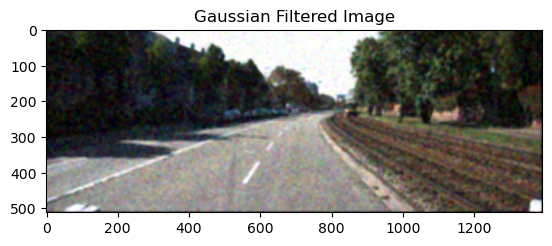

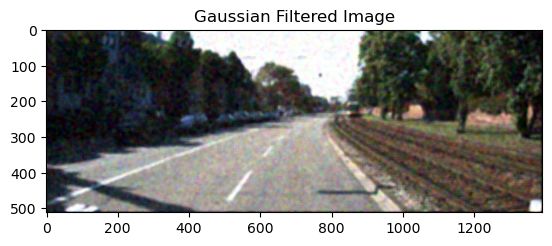

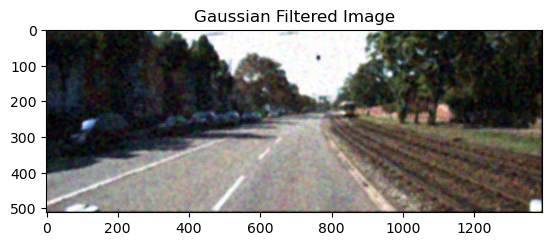

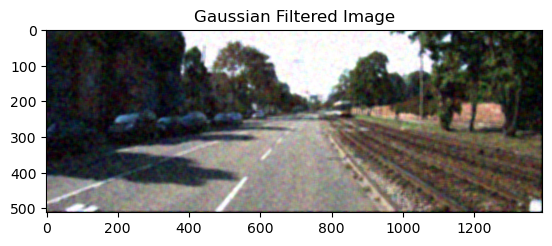

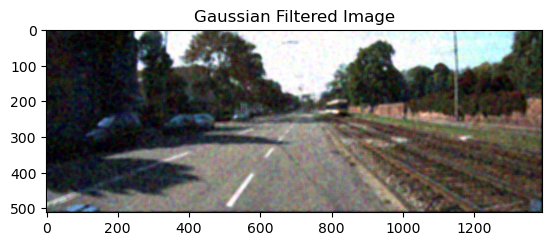

...

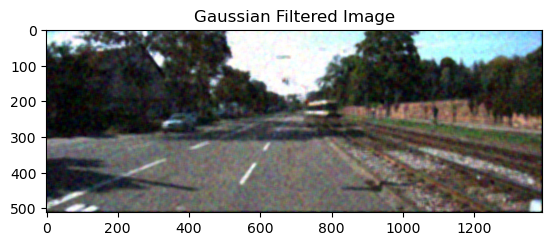

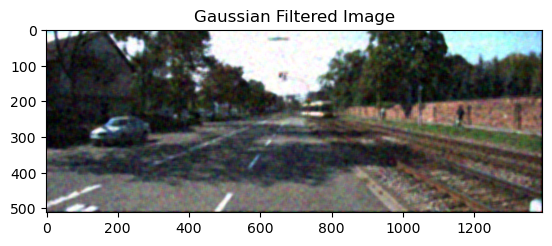

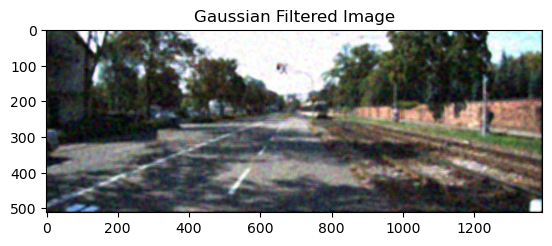

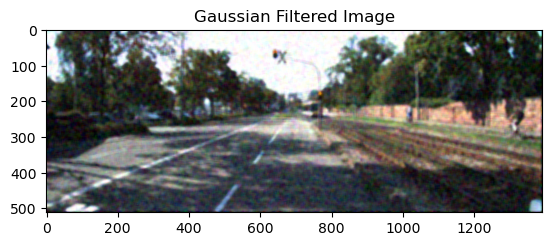

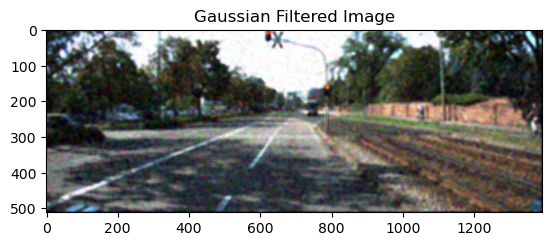

20.484833949368113
0.6133154766755763


In [8]:
# median filter
kernel_size = 10

psnr_sum = 0
ssim_sum = 0

counter = 1

save_dir = 'output_imgs/gaussian_output_imgs'

# Check if the save directory exists, create it if not
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

for gaussian_file, clean_file in tqdm(zip(gaussian_files, clean_files)):
    img = np.array(Image.open(clean_file))/255.0
#     img = np.array(ImageOps.grayscale(Image.open(clean_file)))/255.0
    gaussian_img = np.array(Image.open(gaussian_file))/255.0
#     noisy_img = np.array(ImageOps.grayscale(Image.open(noisy_file)))/255.0
    
    red_channel = gaussian_img[:, :, 0]
    green_channel = gaussian_img[:, :, 1]
    blue_channel = gaussian_img[:, :, 2]
    
    filtered_red = filters.median(red_channel, selem = np.ones((kernel_size, kernel_size)))
    filtered_green = filters.median(green_channel, selem = np.ones((kernel_size, kernel_size)))
    filtered_blue = filters.median(blue_channel, selem = np.ones((kernel_size, kernel_size)))

    filtered_img = np.stack([filtered_red, filtered_green, filtered_blue], axis=-1)
    
    psnr_sum += psnr(filtered_img, img)
    ssim_sum += ssim(filtered_img, img, multichannel=True)
    
    
    # plt.imshow(img, cmap = 'gray')
    # plt.title("The Ground True Image")
    # plt.savefig(os.path.join(save_dir, f"ground_true_image_{counter}.png")) 
    # plt.show()
    # plt.imshow(gaussian_img, cmap = 'gray')
    # plt.title("Gaussian noise Image")
    # plt.savefig(os.path.join(save_dir, f"gaussian_image_{counter}.png"))
    # plt.show()
    plt.imshow(filtered_img, cmap = 'gray')
    plt.title("Gaussian Filtered Image")
    plt.savefig(os.path.join(save_dir, f"gaussian_filtered_image_{counter}.png"))
    plt.show()

    counter += 1

print(psnr_sum/11)
print(ssim_sum/11)


#### Speckle Imgs

0it [00:00, ?it/s]

C:\Users\yyxyy\AppData\Local\Temp\ipykernel_14392\2922545148.py:25: FutureWarning: `selem` is a deprecated argument name for `median`. It will be removed in version 1.0. Please use `footprint` instead.
  filtered_red = filters.median(red_channel, selem = np.ones((kernel_size, kernel_size)))
C:\Users\yyxyy\AppData\Local\Temp\ipykernel_14392\2922545148.py:26: FutureWarning: `selem` is a deprecated argument name for `median`. It will be removed in version 1.0. Please use `footprint` instead.
  filtered_green = filters.median(green_channel, selem = np.ones((kernel_size, kernel_size)))
C:\Users\yyxyy\AppData\Local\Temp\ipykernel_14392\2922545148.py:27: FutureWarning: `selem` is a deprecated argument name for `median`. It will be removed in version 1.0. Please use `footprint` instead.
  filtered_blue = filters.median(blue_channel, selem = np.ones((kernel_size, kernel_size)))
C:\Users\yyxyy\AppData\Local\Temp\ipykernel_14392\2922545148.py:32: FutureWarning: `multichannel` is a deprecated argu

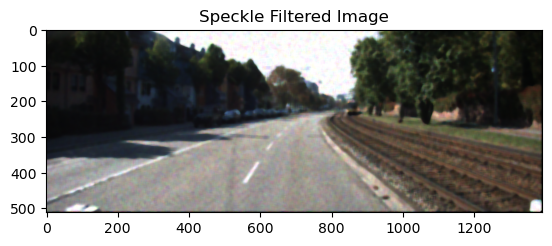

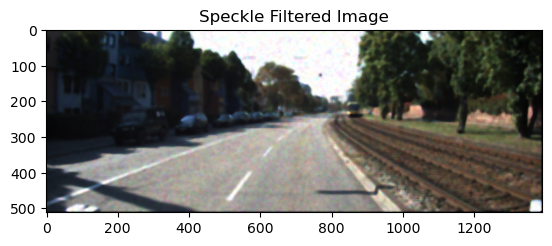

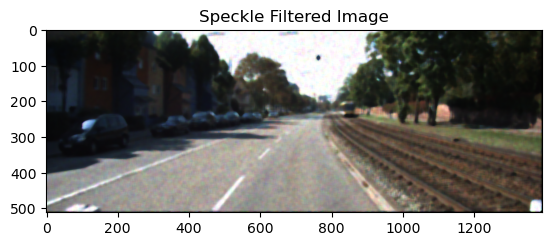

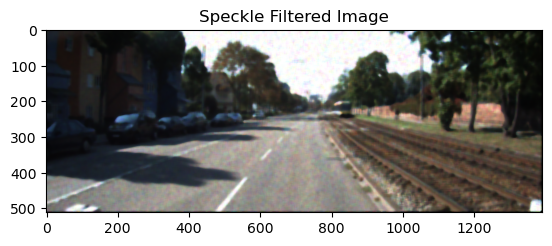

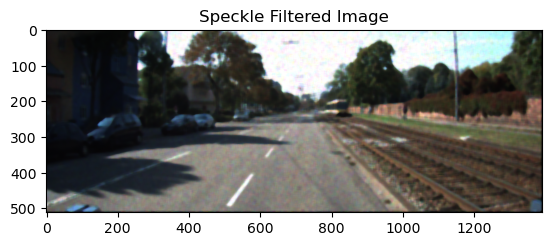

...

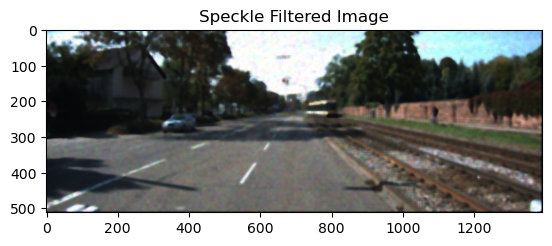

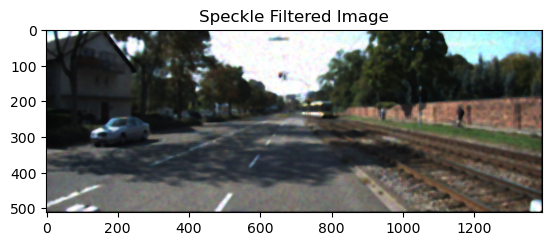

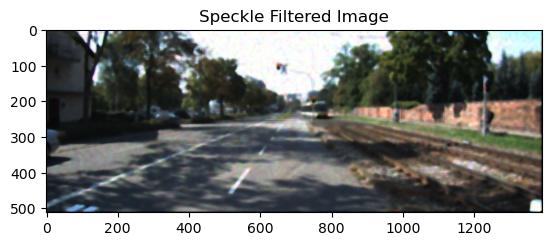

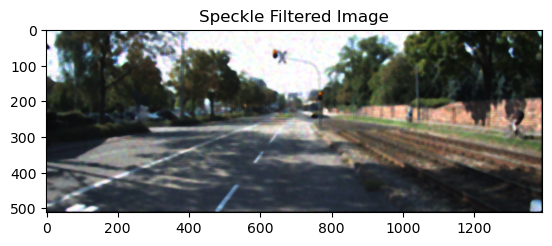

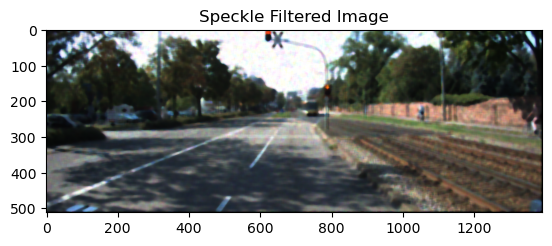

20.876575727433167
0.68460432560609


In [9]:
# speckle_files
# median filter
kernel_size = 10

psnr_sum = 0
ssim_sum = 0
counter = 1

save_dir = 'output_imgs/speckle_output_imgs'

# Check if the save directory exists, create it if not
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

for speckle_file, clean_file in tqdm(zip(speckle_files, clean_files)):
    img = np.array(Image.open(clean_file))/255.0
#     img = np.array(ImageOps.grayscale(Image.open(clean_file)))/255.0
    speckle_img = np.array(Image.open(speckle_file))/255.0
#     noisy_img = np.array(ImageOps.grayscale(Image.open(noisy_file)))/255.0
    
    red_channel = speckle_img[:, :, 0]
    green_channel = speckle_img[:, :, 1]
    blue_channel = speckle_img[:, :, 2]
    
    filtered_red = filters.median(red_channel, selem = np.ones((kernel_size, kernel_size)))
    filtered_green = filters.median(green_channel, selem = np.ones((kernel_size, kernel_size)))
    filtered_blue = filters.median(blue_channel, selem = np.ones((kernel_size, kernel_size)))

    filtered_img = np.stack([filtered_red, filtered_green, filtered_blue], axis=-1)
    
    psnr_sum += psnr(filtered_img, img)
    ssim_sum += ssim(filtered_img, img, multichannel=True)
    
    
    # plt.imshow(img, cmap = 'gray')
    # plt.show()
    # plt.imshow(speckle_img, cmap = 'gray')
    # plt.show()
    plt.imshow(filtered_img, cmap = 'gray')
    plt.title("Speckle Filtered Image")
    plt.savefig(os.path.join(save_dir, f"speckle_filtered_image_{counter}.png"))
    plt.show()

    counter += 1
#     break
print(psnr_sum/11)
print(ssim_sum/11)


### Blur Imgs

In [27]:
'''
Gaussian Blur: 20.5/0.65
Motion Blur: 21.5/0.70
'''
# read files from artifial noises and original images
gblur_files = natsorted(glob("gaussian_blur/*"))
mblur_files = natsorted(glob("motion_blur/*"))

print(len(gblur_files))
print(len(mblur_files))

11
11


#### Gaussian blur imgs

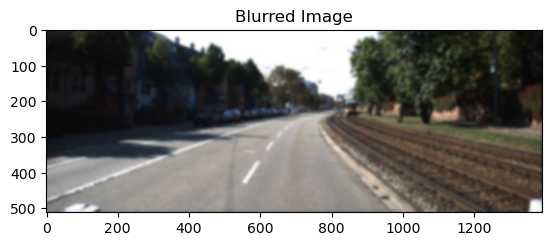

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


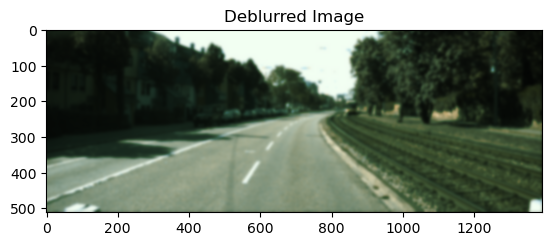

C:\Users\yyxyy\AppData\Local\Temp\ipykernel_22968\2215821526.py:29: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  print(psnr(deblurred_image, img_norm))
C:\Users\yyxyy\AppData\Local\Temp\ipykernel_22968\2215821526.py:30: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  print(ssim(deblurred_image, img_norm, multichannel=True))


68.66734694088288
0.9998223312155993


In [19]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import wiener

# Load the blurred image
blurred_image = plt.imread('gaussian_blur/0000000000.png')
blurred_image_norm = blurred_image / 255.0
img = plt.imread('input_imgs/0000000000.png') 
img_norm = img / 255.0

# Apply the Wiener filter
deblurred_image = wiener(blurred_image_norm, mysize=None, noise=None)

# Display the original and deblurred images
# plt.subplot(1, 2, 1)
plt.imshow(blurred_image, cmap='gray')
plt.title('Blurred Image')
plt.show()
# plt.axis('off')

# plt.subplot(1, 2, 2)
plt.imshow(deblurred_image*255, cmap='gray')
plt.title('Deblurred Image')
# plt.axis('off')

# plt.tight_layout()
plt.show()

print(psnr(deblurred_image, img_norm))
print(ssim(deblurred_image, img_norm, multichannel=True))

0it [00:00, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


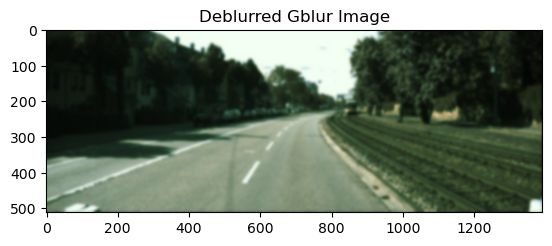

C:\Users\yyxyy\AppData\Local\Temp\ipykernel_14392\713294920.py:39: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_sum += psnr(deblurred_image, img_norm)
C:\Users\yyxyy\AppData\Local\Temp\ipykernel_14392\713294920.py:40: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  ssim_sum += ssim(deblurred_image, img_norm, multichannel=True)
d:\anaconda3\lib\site-packages\skimage\_shared\utils.py:348: UserWarning: Inputs have mismatched dtype.  Setting data_range based on im1.dtype.
  return func(*args, **kwargs)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


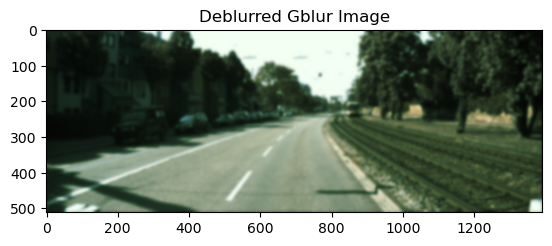

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


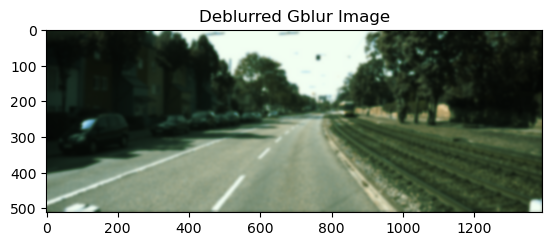

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


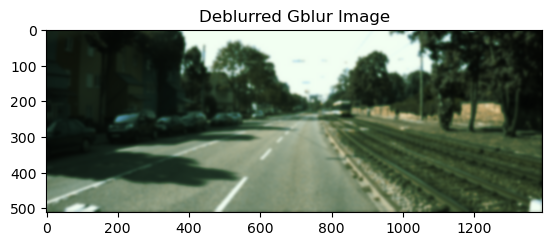

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


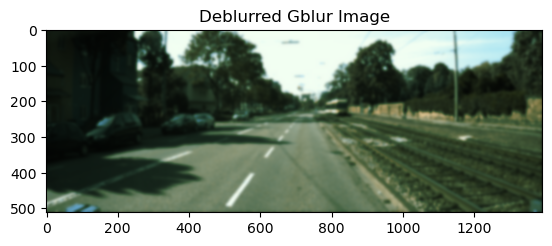

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


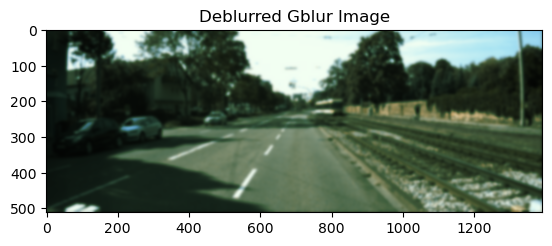

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


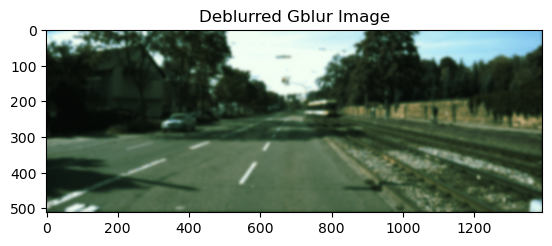

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


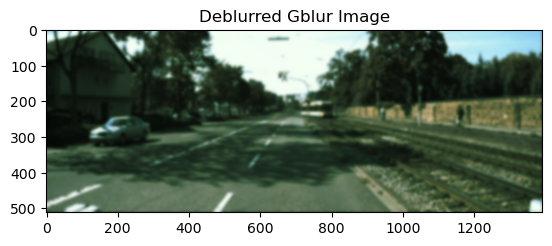

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


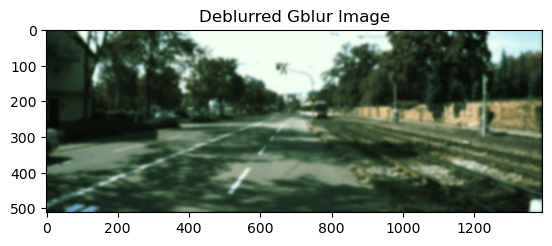

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


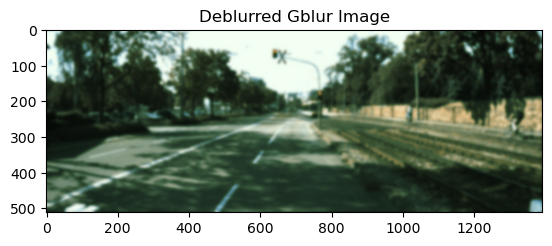

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


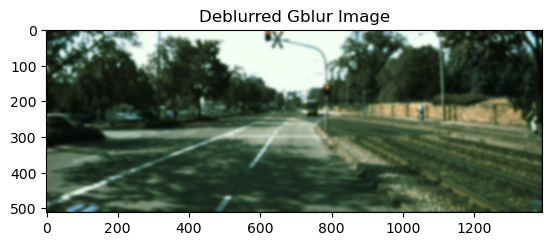

the average psnr is 67.45335730295368
the average ssim is 0.9997775979411216


In [11]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import wiener

psnr_sum = 0
ssim_sum = 0
counter = 1

save_dir = 'output_imgs/gblur_output_imgs'

# Check if the save directory exists, create it if not
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

for gblur_file, clean_file in tqdm(zip(gblur_files, clean_files)):
    gblur_img = plt.imread(gblur_file)
    blurred_image_norm = gblur_img / 255.0
    clean_img = plt.imread(clean_file)
    img_norm = clean_img / 255.0

    deblurred_image = wiener(blurred_image_norm, mysize=None, noise=None)
    
    # Display the original and deblurred images
    # plt.subplot(1, 2, 1)
    # plt.imshow(gblur_img, cmap='gray')
    # plt.title('Blurred Image')
    # plt.axis('off')

    # plt.subplot(1, 2, 2)
    plt.imshow(deblurred_image*255, cmap='gray')
    plt.title('Deblurred Gblur Image')
    # plt.axis('off')
    plt.savefig(os.path.join(save_dir, f"gblur_filtered_image_{counter}.png"))
    plt.show()

    counter += 1

    
    psnr_sum += psnr(deblurred_image, img_norm)
    ssim_sum += ssim(deblurred_image, img_norm, multichannel=True)
    
psnr = psnr_sum/len(clean_files)
ssim = ssim_sum/len(clean_files)

print("the average psnr is", psnr)
print("the average ssim is", ssim)

#### Motion Blur imgs demos

In [13]:
motion_blur_kernel = np.zeros((kernel_size, kernel_size))
motion_blur_kernel[int((kernel_size-1)/2), :] = np.ones(kernel_size)
rotation_matrix = cv2.getRotationMatrix2D((int((kernel_size-1)/2), int((kernel_size-1)/2)), angle, 1)
motion_blur_kernel = cv2.warpAffine(motion_blur_kernel, rotation_matrix, (kernel_size, kernel_size))

NameError: name 'angle' is not defined

In [12]:
image = cv2.imread("motion_blur/0000000000.png")
clean_img = cv2.imread("input_imgs/0000000000.png")
# gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

kernel_size = 7  # Adjust the kernel size based on the length of the motion blur
angle = 90  # Adjust the angle based on the direction of the motion blur
motion_blur_kernel = np.zeros((kernel_size, kernel_size))
motion_blur_kernel[int((kernel_size - 1) / 2), :] = np.ones(kernel_size) 
motion_blur_kernel = cv2.warpAffine(motion_blur_kernel, cv2.getRotationMatrix2D((kernel_size / 2 - 0.5, kernel_size / 2 - 0.5), angle, 1.0), (kernel_size, kernel_size))
motion_blur_kernel = motion_blur_kernel / kernel_size

r = image[:,:,0]
g = image[:,:,1]
b = image[:,:,2]

r_f = cv2.filter2D(r, -1, motion_blur_kernel/np.sum(motion_blur_kernel))
g_f = cv2.filter2D(g, -1, motion_blur_kernel/np.sum(motion_blur_kernel))
b_f = cv2.filter2D(b, -1, motion_blur_kernel/np.sum(motion_blur_kernel))

restored_image = cv2.merge((b_f, g_f, r_f))
# restored_image = cv2.filter2D(gray, -1, motion_blur_kernel)


cv2.imshow('Original Image', clean_img)
cv2.imshow('Restored Image', restored_image)
cv2.waitKey(0)
cv2.destroyAllWindows()

print(psnr(clean_img, restored_image))
print(ssim(clean_img, restored_image , multichannel=True))

20.126104751008604
0.5132404777585465


C:\Users\yyxyy\AppData\Local\Temp\ipykernel_21756\3777653204.py:30: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  print(ssim(clean_img, restored_image , multichannel=True))


In [13]:
image = cv2.imread("motion_blur/0000000010.png")
clean_img = cv2.imread("input_imgs/0000000010.png")
# gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

kernel_size = 7  # Adjust the kernel size based on the length of the motion blur
angle = 90  # Adjust the angle based on the direction of the motion blur
motion_blur_kernel = np.zeros((kernel_size, kernel_size))
motion_blur_kernel[int((kernel_size - 1) / 2), :] = np.ones(kernel_size) 
motion_blur_kernel = cv2.warpAffine(motion_blur_kernel, cv2.getRotationMatrix2D((kernel_size / 2 - 0.5, kernel_size / 2 - 0.5), angle, 1.0), (kernel_size, kernel_size))
motion_blur_kernel = motion_blur_kernel / kernel_size

r = image[:,:,0]
g = image[:,:,1]
b = image[:,:,2]

r_f = cv2.filter2D(r, -1, motion_blur_kernel/np.sum(motion_blur_kernel))
g_f = cv2.filter2D(g, -1, motion_blur_kernel/np.sum(motion_blur_kernel))
b_f = cv2.filter2D(b, -1, motion_blur_kernel/np.sum(motion_blur_kernel))

restored_image = cv2.merge((r_f, g_f, b_f))
# restored_image = cv2.filter2D(gray, -1, motion_blur_kernel)


cv2.imshow('Original Image', image)
cv2.imshow('Restored Image', restored_image)
cv2.waitKey(0)
cv2.destroyAllWindows()

print(psnr(clean_img, restored_image))
print(ssim(clean_img, restored_image , multichannel=True))

20.893845055048715
0.5333634123507767


C:\Users\yyxyy\AppData\Local\Temp\ipykernel_21756\518664657.py:30: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  print(ssim(clean_img, restored_image , multichannel=True))


In [18]:
image = cv2.imread("motion_blur/0000000020.png")
clean_img = cv2.imread("input_imgs/0000000020.png")
# gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

kernel_size = 7  # Adjust the kernel size based on the length of the motion blur
angle = 90  # Adjust the angle based on the direction of the motion blur
motion_blur_kernel = np.zeros((kernel_size, kernel_size))
motion_blur_kernel[int((kernel_size - 1) / 2), :] = np.ones(kernel_size) 
motion_blur_kernel = cv2.warpAffine(motion_blur_kernel, cv2.getRotationMatrix2D((kernel_size / 2 - 0.5, kernel_size / 2 - 0.5), angle, 1.0), (kernel_size, kernel_size))
motion_blur_kernel = motion_blur_kernel / kernel_size


r = image[:,:,0]
g = image[:,:,1]
b = image[:,:,2]

r_f = cv2.filter2D(r, -1, motion_blur_kernel/np.sum(motion_blur_kernel))
g_f = cv2.filter2D(g, -1, motion_blur_kernel/np.sum(motion_blur_kernel))
b_f = cv2.filter2D(b, -1, motion_blur_kernel/np.sum(motion_blur_kernel))

restored_image = cv2.merge((r_f, g_f, b_f))
# restored_image = cv2.filter2D(gray, -1, motion_blur_kernel)


cv2.imshow('Original Image', image)
cv2.imshow('Restored Image', restored_image)
cv2.waitKey(0)
cv2.destroyAllWindows()

print(psnr(clean_img, restored_image))
print(ssim(clean_img, restored_image , multichannel=True))

TypeError: 'numpy.float64' object is not callable

#### Motion Blur imgs

In [ ]:
# def find_best_filter(img,gt):
#     # img = img.astype(float) / 255.0
#     img = img_as_float(img)
#     img_best = np.zeros_like(img)
#     psnr_best = 0
#     ssim_best = 0
#     ksize_best = 0
#     angel_best = 0
#     for a in range(36):
#         # for k in range(30):
#             # kernel_size, angel = 2k+3, a10
#             kernel_size, angel = 19, a10
#             kernel = motion_kernel(kernel_size, angel)
#             img_out = np.zeros_like(img)
#             for i in range(3):
#                 img_out[:, :, i] = wiener(img[:, :, i], kernel, balance=1)
#             img_out = np.clip(img_out255, 0, 255).astype(np.uint8)
#             ssim_img = structural_similarity(img_as_float(img_out), img_as_float(gt),channel_axis = 2)
#             if ssim_img > ssim_best:
#                 ksize_best, angel_best = kernel_size, angel
#                 ssim_best = ssim_img
#                 psnr_best = peak_signal_noise_ratio(gt,img_out,data_range=255)
#                 img_best = img_out.copy()
#     print(ksize_best, angel_best, psnr_best, ssim_best)
#     return psnr_best, ssim_best, img_best

In [50]:
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

def mblur_best(mblur_img, clean_img):
    psnr_best = 0
    ssim_best = 0
    img_best = np.zeros_like(mblur_img)
    kb, angle_b = 0, 0

    for a in range(36):
        for k in range(30):
            kernel_size, angle = 2*k+3, a*10
            motion_blur_kernel = np.zeros((kernel_size, kernel_size))
            motion_blur_kernel[int((kernel_size - 1) / 2), :] = np.ones(kernel_size) 
            motion_blur_kernel = cv2.warpAffine(motion_blur_kernel, cv2.getRotationMatrix2D((kernel_size / 2 - 0.5, kernel_size / 2 - 0.5), angle, 1.0), (kernel_size, kernel_size))
            motion_blur_kernel = motion_blur_kernel / kernel_size


            r = mblur_img[:,:,0]
            g = mblur_img[:,:,1]
            b = mblur_img[:,:,2]

            r_f = cv2.filter2D(r, -1, motion_blur_kernel/np.sum(motion_blur_kernel))
            g_f = cv2.filter2D(g, -1, motion_blur_kernel/np.sum(motion_blur_kernel))
            b_f = cv2.filter2D(b, -1, motion_blur_kernel/np.sum(motion_blur_kernel))

            restored_image = cv2.merge((r_f, g_f, b_f))

            ssim_i = ssim(restored_image, clean_img, multichannel=True)

            if ssim_i > ssim_best:
                kb, angle_b = kernel_size, angle
                ssim_best = ssim_i
                img_best = restored_image.copy()
                psnr_best = psnr(img_best, clean_img)

    return psnr_best, ssim_best, img_best


    

In [51]:
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

psnr_sum = 0
ssim_sum = 0

for mblur_file, clean_file in tqdm(zip(mblur_files, clean_files)):
    mblur_img = cv2.imread(mblur_file)
    clean_img = cv2.imread(clean_file)

    # kernel_size = 1  # Adjust the kernel size based on the length of the motion blur
    # angle = 90  # Adjust the angle based on the direction of the motion blur
    # motion_blur_kernel = np.zeros((kernel_size, kernel_size))
    # motion_blur_kernel[int((kernel_size - 1) / 2), :] = np.ones(kernel_size) 
    # motion_blur_kernel = cv2.warpAffine(motion_blur_kernel, cv2.getRotationMatrix2D((kernel_size / 2 - 0.5, kernel_size / 2 - 0.5), angle, 1.0), (kernel_size, kernel_size))
    # motion_blur_kernel = motion_blur_kernel / kernel_size


    # r = mblur_img[:,:,0]
    # g = mblur_img[:,:,1]
    # b = mblur_img[:,:,2]

    # r_f = cv2.filter2D(r, -1, motion_blur_kernel/np.sum(motion_blur_kernel))
    # g_f = cv2.filter2D(g, -1, motion_blur_kernel/np.sum(motion_blur_kernel))
    # b_f = cv2.filter2D(b, -1, motion_blur_kernel/np.sum(motion_blur_kernel))

    # restored_image = cv2.merge((r_f, g_f, b_f))
    # restored_image = cv2.filter2D(gray, -1, motion_blur_kernel)


    # plt.imshow(restored_image, cmap="gray")
    # plt.title('Deblurred Mblur Image')
    # plt.show()

    psnr_best, ssim_best, img_best = mblur_best(mblur_img, clean_img)
    psnr_sum += psnr_best
    ssim_sum += ssim_best

    # psnr_sum += psnr(clean_img, restored_image)
    # ssim_sum += ssim(clean_img, restored_image , multichannel=True)

psnr = psnr_sum/len(clean_files)
ssim = ssim_sum/len(clean_files)

print("the average psnr is", psnr)
print("the average ssim is", ssim)
    

0it [00:00, ?it/s]

C:\Users\yyxyy\AppData\Local\Temp\ipykernel_14392\322806982.py:29: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  ssim_i = ssim(restored_image, clean_img, multichannel=True)


the average psnr is 20.012657666403694
the average ssim is 0.5176519286272692


In [52]:
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

def mblur_best_psnr(mblur_img, clean_img):
    psnr_best = 0
    ssim_best = 0
    img_best = np.zeros_like(mblur_img)
    kb, angle_b = 0, 0

    for a in range(36):
        for k in range(30):
            kernel_size, angle = 2*k+3, a*10
            motion_blur_kernel = np.zeros((kernel_size, kernel_size))
            motion_blur_kernel[int((kernel_size - 1) / 2), :] = np.ones(kernel_size) 
            motion_blur_kernel = cv2.warpAffine(motion_blur_kernel, cv2.getRotationMatrix2D((kernel_size / 2 - 0.5, kernel_size / 2 - 0.5), angle, 1.0), (kernel_size, kernel_size))
            motion_blur_kernel = motion_blur_kernel / kernel_size


            r = mblur_img[:,:,0]
            g = mblur_img[:,:,1]
            b = mblur_img[:,:,2]

            r_f = cv2.filter2D(r, -1, motion_blur_kernel/np.sum(motion_blur_kernel))
            g_f = cv2.filter2D(g, -1, motion_blur_kernel/np.sum(motion_blur_kernel))
            b_f = cv2.filter2D(b, -1, motion_blur_kernel/np.sum(motion_blur_kernel))

            restored_image = cv2.merge((r_f, g_f, b_f))

            psnr_i = psnr(restored_image, clean_img)

            # ssim_i = ssim(restored_image, clean_img, multichannel=True)

            if psnr_i > psnr_best:
                kb, angle_b = kernel_size, angle
                psnr_best = psnr_i
                img_best = restored_image.copy()
                ssim_best = ssim(restored_image, clean_img, multichannel=True)

    return psnr_best, ssim_best, img_best

0it [00:00, ?it/s]

C:\Users\yyxyy\AppData\Local\Temp\ipykernel_14392\396044852.py:37: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  ssim_best = ssim(restored_image, clean_img, multichannel=True)


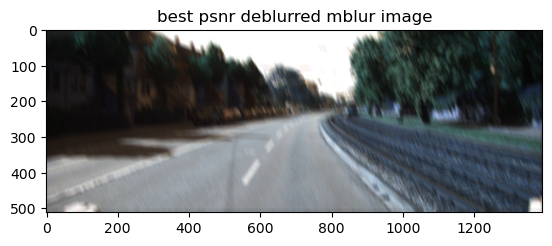

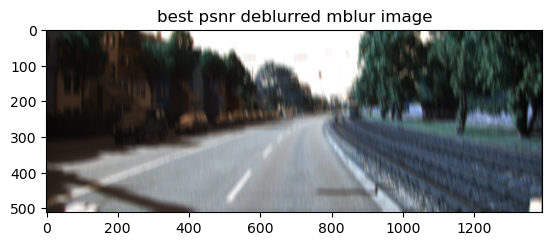

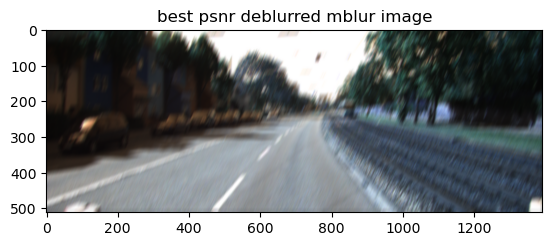

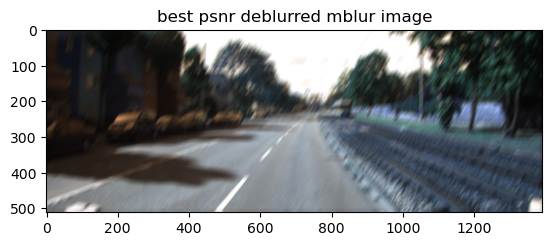

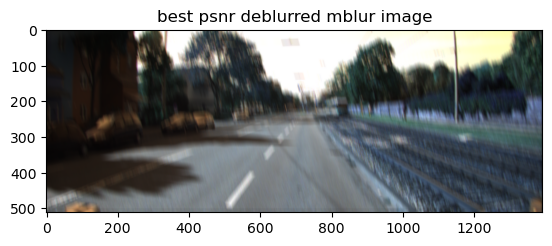

...

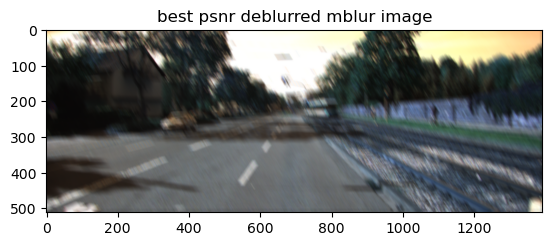

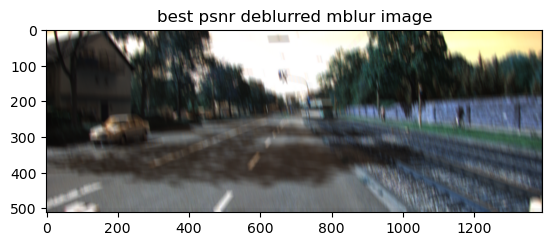

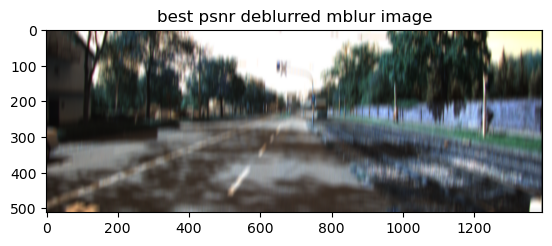

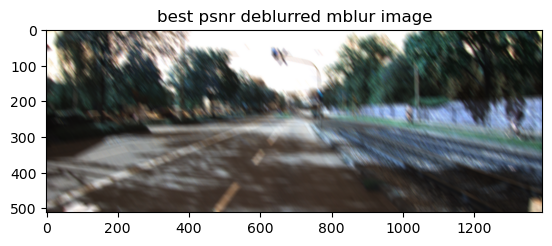

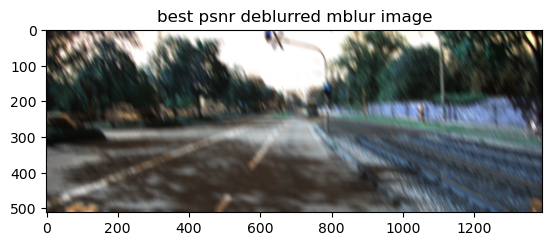

the average psnr is 20.089509442221555
the average ssim is 0.5136849119192712


In [53]:
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

psnr_sum = 0
ssim_sum = 0

for mblur_file, clean_file in tqdm(zip(mblur_files, clean_files)):
    mblur_img = cv2.imread(mblur_file)
    clean_img = cv2.imread(clean_file)

    # kernel_size = 1  # Adjust the kernel size based on the length of the motion blur
    # angle = 90  # Adjust the angle based on the direction of the motion blur
    # motion_blur_kernel = np.zeros((kernel_size, kernel_size))
    # motion_blur_kernel[int((kernel_size - 1) / 2), :] = np.ones(kernel_size) 
    # motion_blur_kernel = cv2.warpAffine(motion_blur_kernel, cv2.getRotationMatrix2D((kernel_size / 2 - 0.5, kernel_size / 2 - 0.5), angle, 1.0), (kernel_size, kernel_size))
    # motion_blur_kernel = motion_blur_kernel / kernel_size


    # r = mblur_img[:,:,0]
    # g = mblur_img[:,:,1]
    # b = mblur_img[:,:,2]

    # r_f = cv2.filter2D(r, -1, motion_blur_kernel/np.sum(motion_blur_kernel))
    # g_f = cv2.filter2D(g, -1, motion_blur_kernel/np.sum(motion_blur_kernel))
    # b_f = cv2.filter2D(b, -1, motion_blur_kernel/np.sum(motion_blur_kernel))

    # restored_image = cv2.merge((r_f, g_f, b_f))
    # restored_image = cv2.filter2D(gray, -1, motion_blur_kernel)


    # plt.imshow(restored_image, cmap="gray")
    # plt.title('Deblurred Mblur Image')
    # plt.show()

    psnr_best, ssim_best, img_best = mblur_best_psnr(mblur_img, clean_img)
    psnr_sum += psnr_best
    ssim_sum += ssim_best

    plt.imshow(img_best, cmap="gray")
    plt.title("best psnr deblurred mblur image")
    plt.show()

    # psnr_sum += psnr(clean_img, restored_image)
    # ssim_sum += ssim(clean_img, restored_image , multichannel=True)

psnr = psnr_sum/len(clean_files)
ssim = ssim_sum/len(clean_files)

print("the average psnr is", psnr)
print("the average ssim is", ssim)